In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Imports and data loader

In [ ]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import DataLoader,Dataset, random_split
from torch.nn.utils.rnn import pad_sequence
import torchvision.transforms as T
import spacy
from collections import Counter
import os
from PIL import Image

In [ ]:
with open("/content/drive/MyDrive/DeepLearning/Dataset/vn_captions.txt") as c:
  captions = c.read()

captions = captions.split("\n")[:-1]

print(captions[1])

1000268201_693b08cb0e.jpg,Một đứa trẻ mặc một chiếc váy màu hồng đang leo lên một bộ cầu thang theo cách vào.


In [ ]:
def getCaptionsPerImage(captions):
  img = {}
  for caption in captions:
    caption = caption.split(",")
    if img.get(caption[0]) is None:
      img[caption[0]] = []
    img[caption[0]].append(caption[1])
  return img

img_des = getCaptionsPerImage(captions)
img_des.pop('image', None)

['caption']

In [ ]:
print(img_des["1000268201_693b08cb0e.jpg"])

['Một đứa trẻ mặc một chiếc váy màu hồng đang leo lên một bộ cầu thang theo cách vào.', 'Một cô gái đi vào một tòa nhà bằng gỗ.', 'Một cô bé leo lên một nhà chơi gỗ.', 'Một cô bé leo lên cầu thang đến nhà chơi của mình.', 'Một cô bé mặc một chiếc váy màu hồng đi vào cabin bằng gỗ.']


In [ ]:
!pip install underthesea


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 657.8/657.8 kB 32.3 MB/s eta 0:00:00


In [ ]:
import underthesea
from underthesea import word_tokenize
from collections import Counter

# Sample Vietnamese text
vietnamese_text = "Chào bạn, hôm nay là một ngày đẹp trời."

# Tokenize the text
tokens = word_tokenize(vietnamese_text)

# Print the tokens
print(tokens)


['Chào', 'bạn', ',', 'hôm nay', 'là', 'một', 'ngày', 'đẹp', 'trời', '.']


In [ ]:
class Vocabulary:
    def __init__(self, freq_threshold):
        # Setting the pre-reserved tokens int to string tokens
        self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}

        # String to int tokens
        # Its reverse dict self.itos
        self.stoi = {v: k for k, v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self):
        return len(self.itos)

    @staticmethod
    def tokenize(text):
        return word_tokenize(text)

    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1

                # Add the word to the vocab if it reaches minimum frequency threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text):
        """ For each word in the text corresponding index token for that word form the vocab built as list """
        tokenized_text = self.tokenize(text)
        return [self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text]

In [ ]:
class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    """
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

In [ ]:
class FlickrDataset(Dataset):
    """
    FlickrDataset
    """
    def __init__(self,root_dir,captions_file,transform=None,freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform

        #Get image and caption colum from the dataframe
        self.imgs = self.df["image"]
        self.captions = self.df["caption"].astype(str)

        #Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())


    def __len__(self):
        return len(self.df)

    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)
        img = Image.open(img_location).convert("RGB")

        #apply the transfromation to the image
        if self.transform is not None:
            img = self.transform(img)

        #numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

In [ ]:
data_location = "/content/drive/MyDrive/DeepLearning/Dataset"

# Begin

In [ ]:
transforms = T.Compose([
    T.Resize(226),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/vn_captions.csv",
    transform=transforms
)

In [ ]:
BATCH_SIZE = 200
# BATCH_SIZE = 6
NUM_WORKER = 4

pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

vocab_size = len(dataset.vocab)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [ ]:
print(vocab_size)

2411


# Model

In [ ]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

In [ ]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)


    def forward(self, images):
        features = self.resnet(images)                                    #(batch_size,2048,7,7)
        features = features.permute(0, 2, 3, 1)                           #(batch_size,7,7,2048)
        features = features.view(features.size(0), -1, features.size(-1)) #(batch_size,49,2048)
        return features

In [ ]:
#Bahdanau Attention
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()

        self.attention_dim = attention_dim

        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)

        self.A = nn.Linear(attention_dim,1)




    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)

        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attemtion_dim)

        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)


        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)

        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,num_layers)

        return alpha,attention_weights

In [ ]:
#Attention Decoder
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()

        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim

        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)


        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)


        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)



    def forward(self, features, captions):

        #vectorize the caption
        embeds = self.embedding(captions)

        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)

        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)

        for s in range(seq_length):
            alpha,context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))

            output = self.fcn(self.drop(h))

            preds[:,s] = output
            alphas[:,s] = alpha


        return preds, alphas

    def generate_caption(self,features,max_len=20,vocab=None):
        # Inference part
        # Given the image features generate the captions

        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        alphas = []

        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)


        captions = []

        for i in range(max_len):
            alpha,context = self.attention(features, h)


            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())

            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)


            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)

            #save the generated word
            captions.append(predicted_word_idx.item())

            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break

            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))

        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas


    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c

In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )

    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

# Init model/params

In [ ]:
#Hyperparams
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 0.01

In [ ]:
#init model
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 128MB/s]


In [ ]:
import os

def save_model(model, num_epochs, folder_path="models"):
  # Create the folder if it doesn't exist
  if not os.path.exists(folder_path):
    os.makedirs(folder_path)
  # Construct the model filename with epoch information
  filename = f"vnattention_model_state_{num_epochs}.pth"
  model_path = os.path.join(folder_path, filename)

  model_state = {
      'num_epochs': num_epochs,
      'embed_size': embed_size,
      'vocab_size': len(dataset.vocab),
      'attention_dim': attention_dim,
      'encoder_dim': encoder_dim,
      'decoder_dim': decoder_dim,
      'state_dict': model.state_dict()
  }

  torch.save(model_state, model_path)
  print(f"Model saved to: {model_path}")

In [ ]:
import matplotlib.pyplot as plt
def show_image(img, title=None):
    """Imshow for Tensor."""

    #unnormalize
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))


    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

Epoch: 1 loss: 3.14727


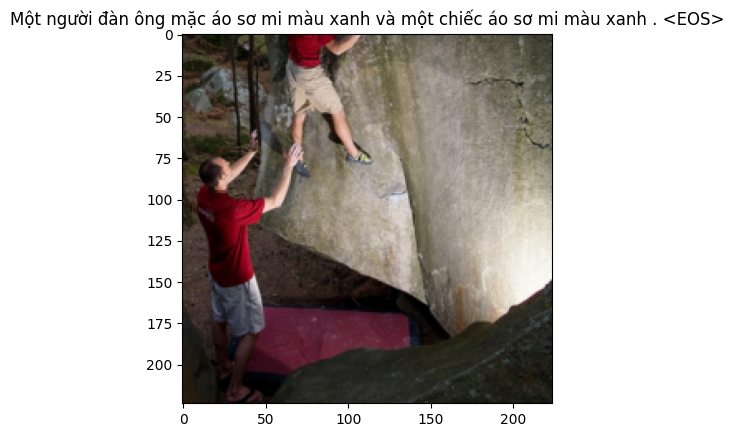

Epoch: 1 loss: 2.92907


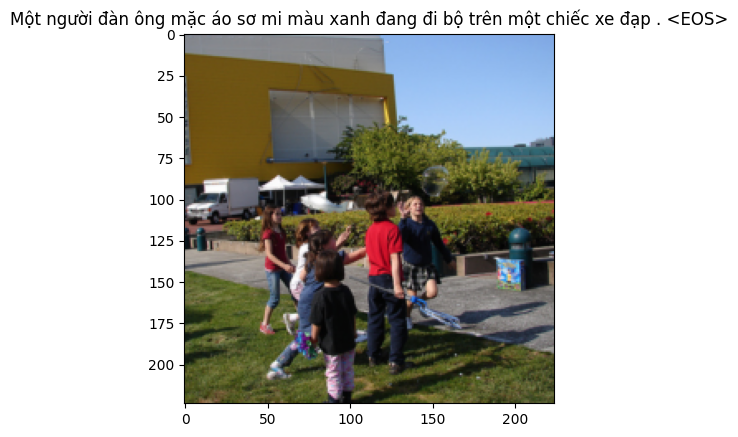

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_1.pth
Epoch: 2 loss: 2.90455


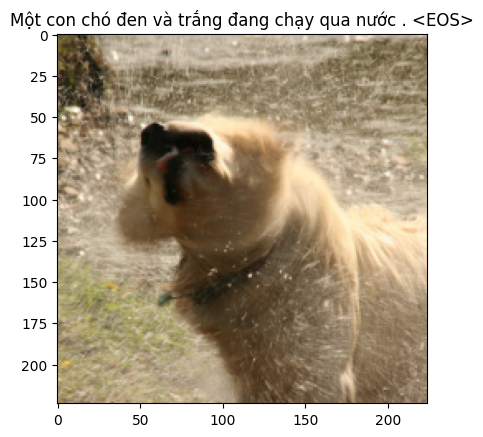

Epoch: 2 loss: 2.91410


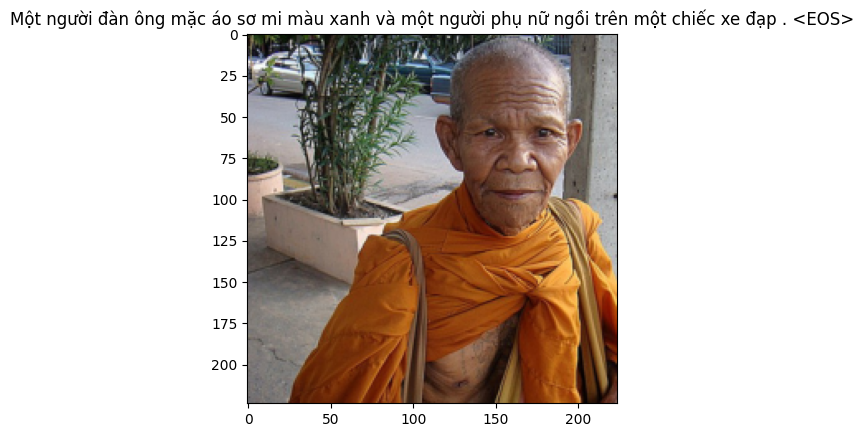

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_2.pth
Epoch: 3 loss: 2.78027


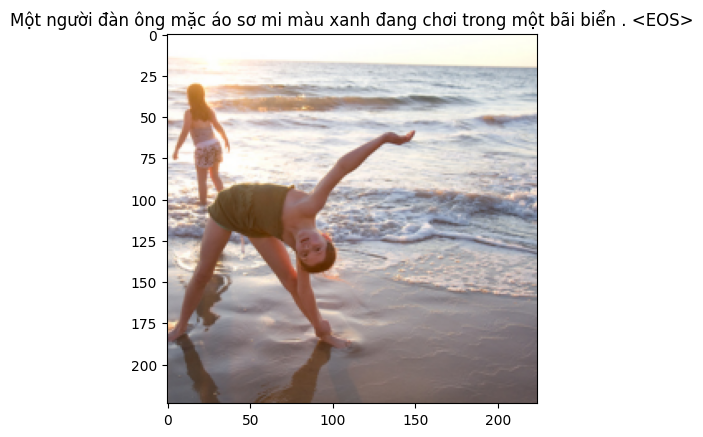

Epoch: 3 loss: 2.65978


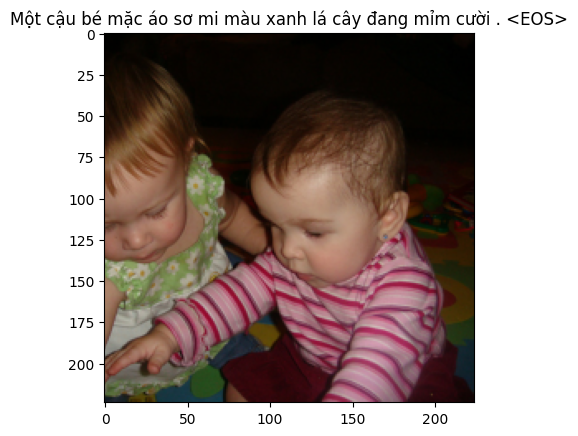

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_3.pth
Epoch: 4 loss: 2.71185


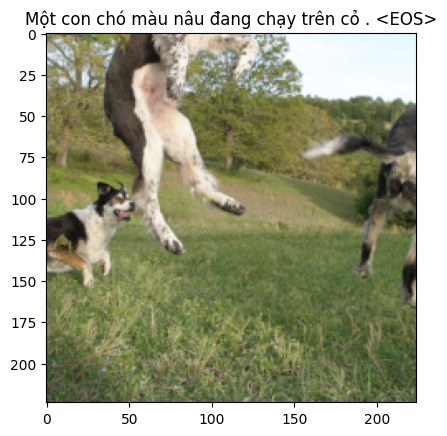

Epoch: 4 loss: 2.75622


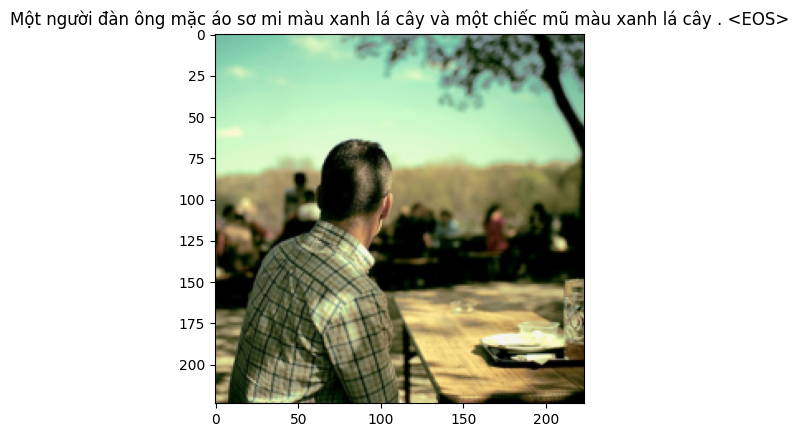

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_4.pth
Epoch: 5 loss: 2.67587


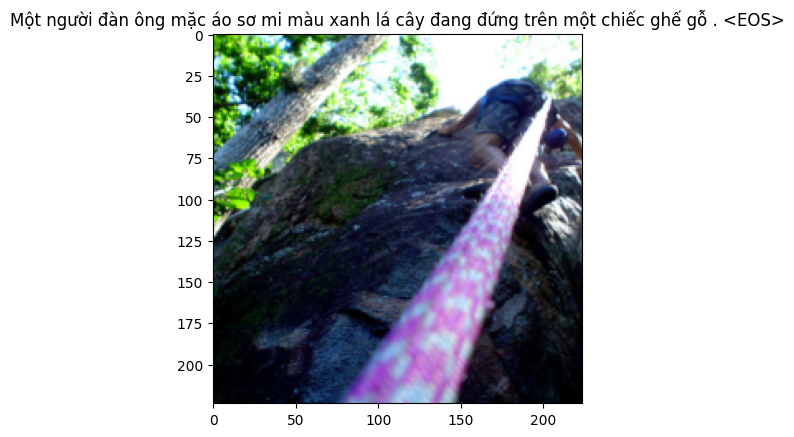

Epoch: 5 loss: 2.67905


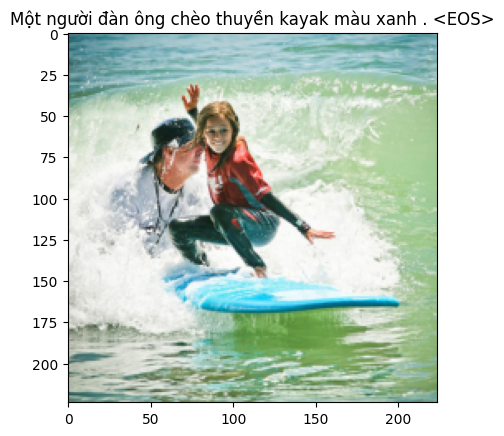

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_5.pth
Epoch: 6 loss: 2.59104


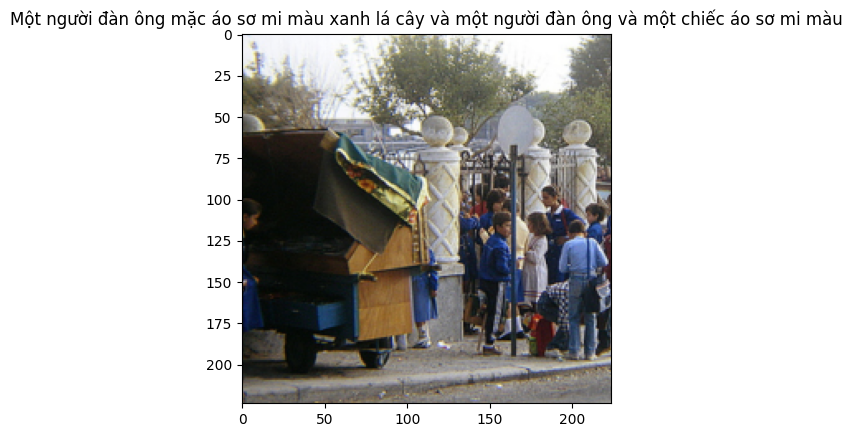

Epoch: 6 loss: 2.67391


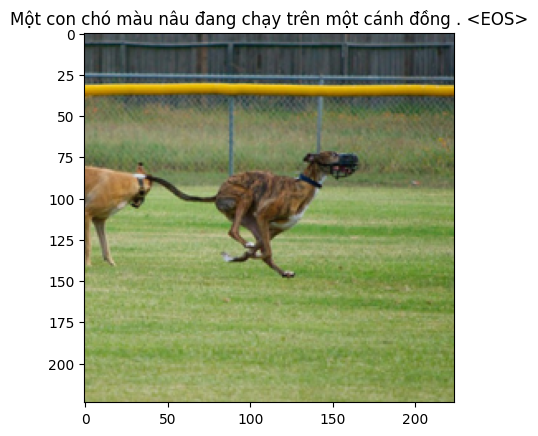

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_6.pth
Epoch: 7 loss: 2.59990


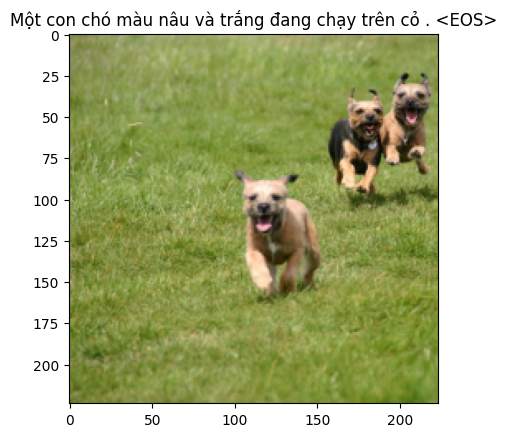

Epoch: 7 loss: 2.53478


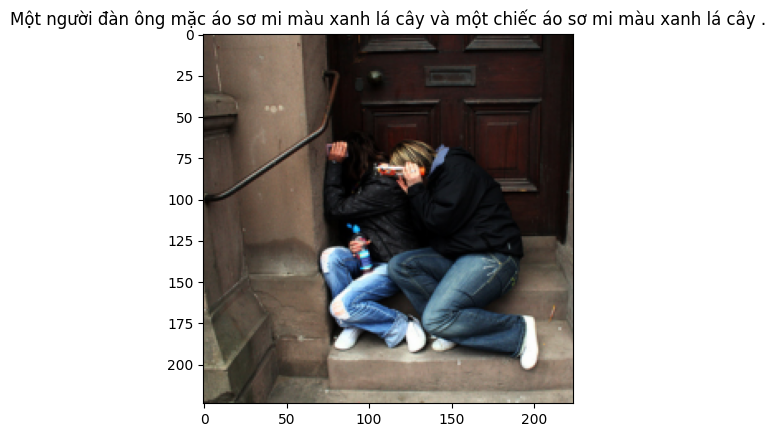

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_7.pth
Epoch: 8 loss: 2.60197


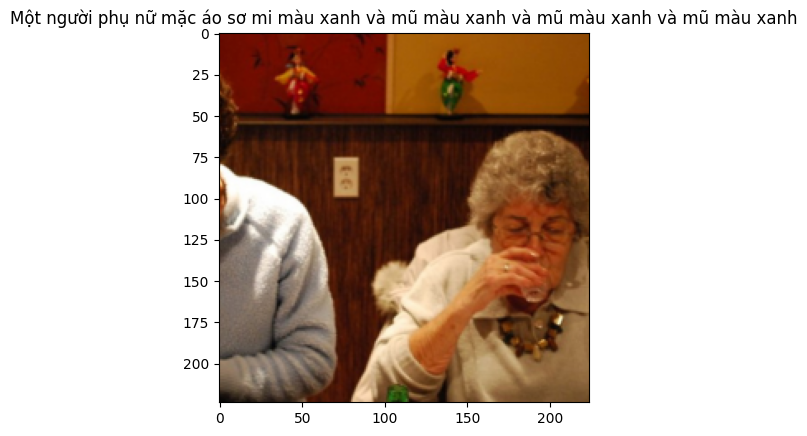

Epoch: 8 loss: 2.70436


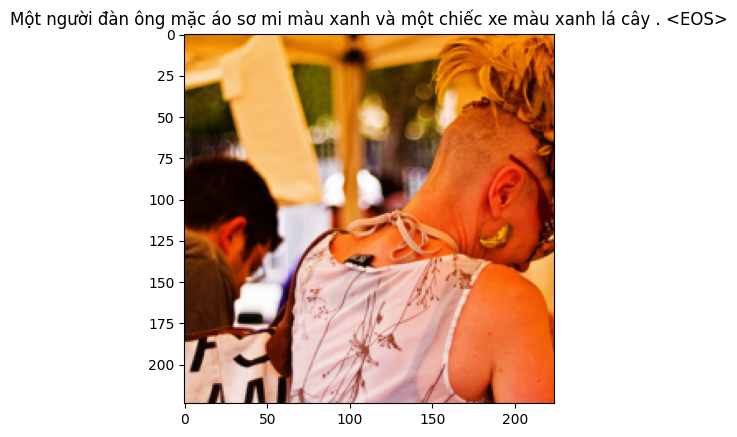

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_8.pth
Epoch: 9 loss: 2.70088


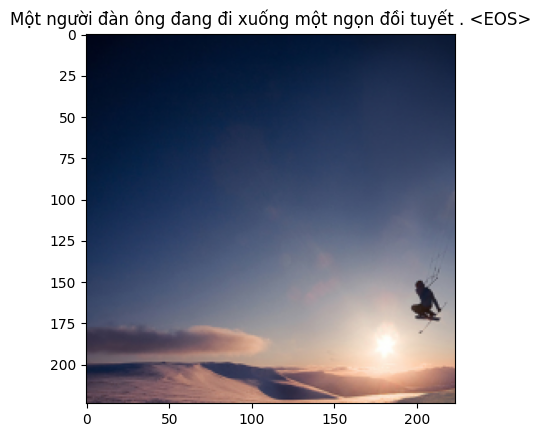

Epoch: 9 loss: 2.55564


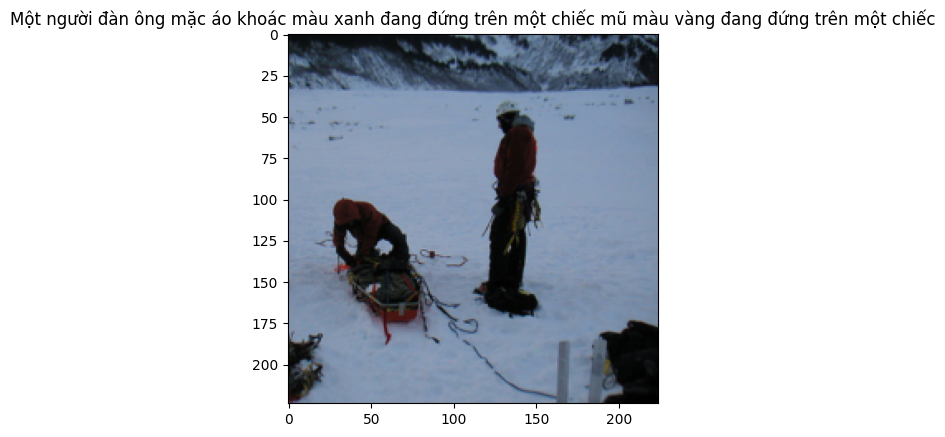

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_9.pth
Epoch: 10 loss: 2.64588


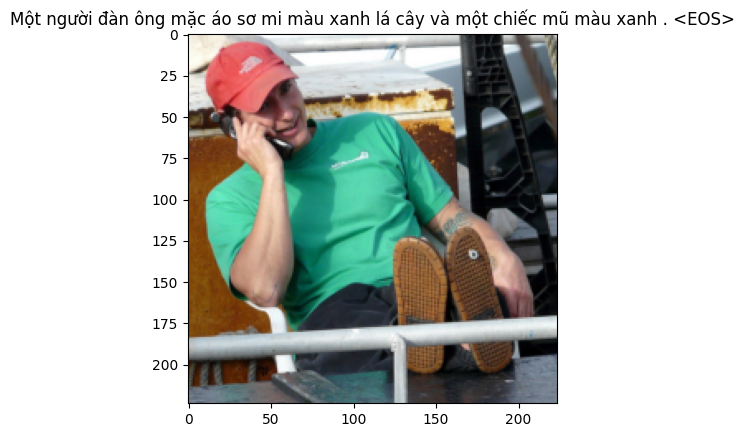

Epoch: 10 loss: 2.68857


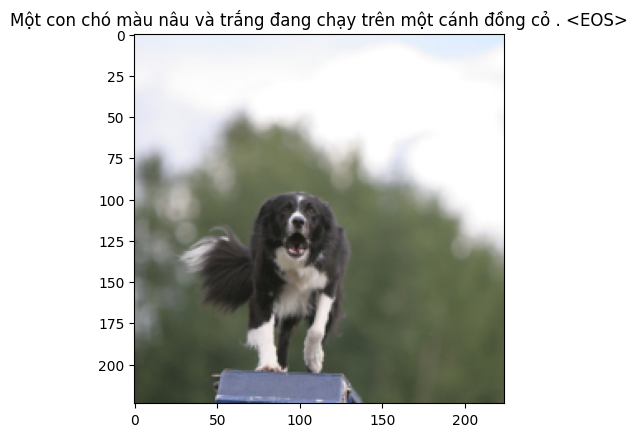

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_10.pth
Epoch: 11 loss: 2.49668


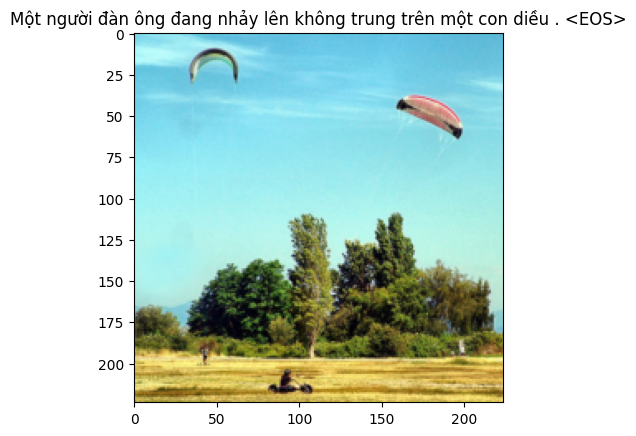

Epoch: 11 loss: 2.56836


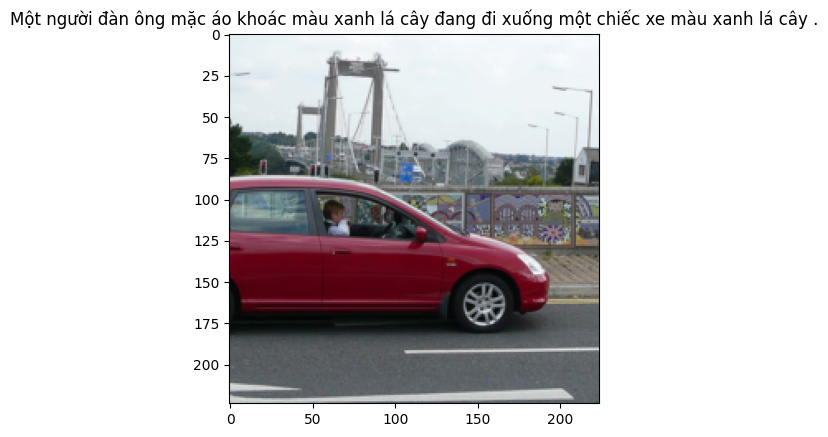

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_11.pth
Epoch: 12 loss: 2.66193


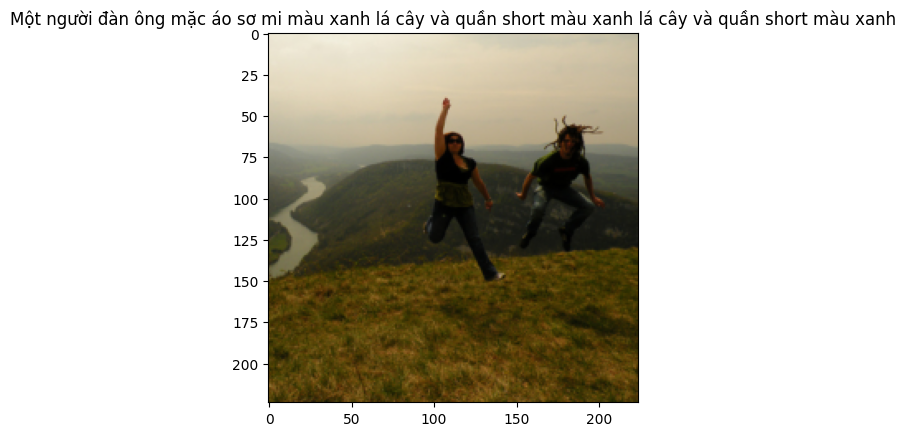

Epoch: 12 loss: 2.57943


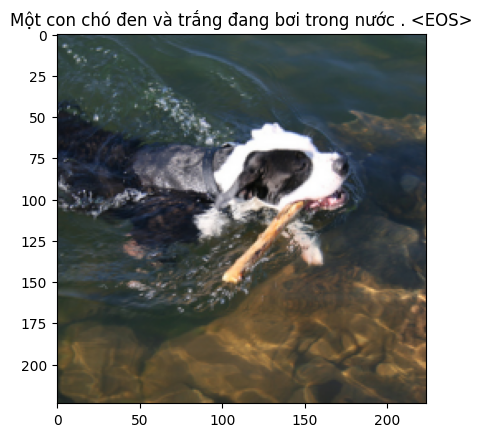

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_12.pth
Epoch: 13 loss: 2.47764


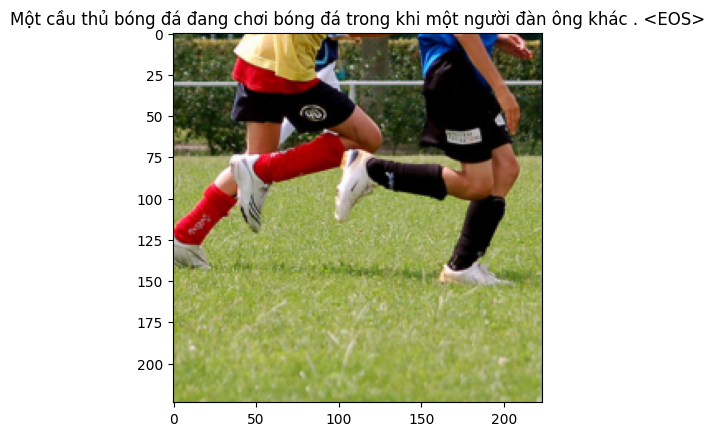

Epoch: 13 loss: 2.62487


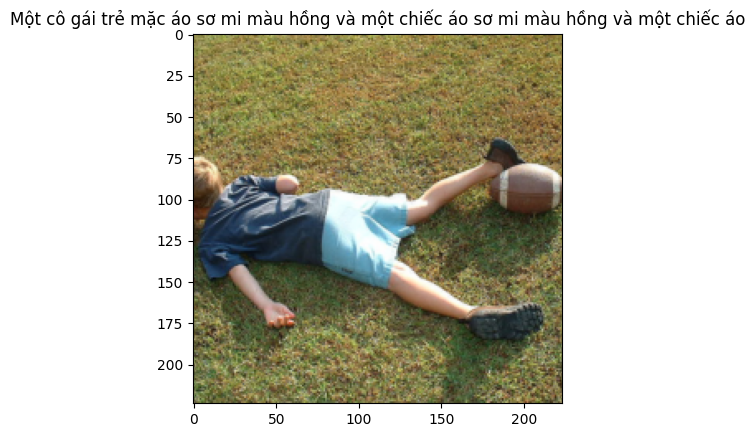

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_13.pth
Epoch: 14 loss: 2.62935


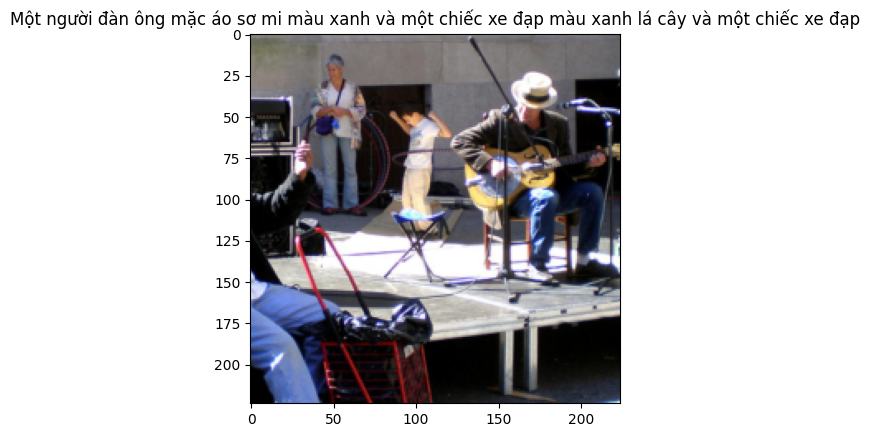

Epoch: 14 loss: 2.55403


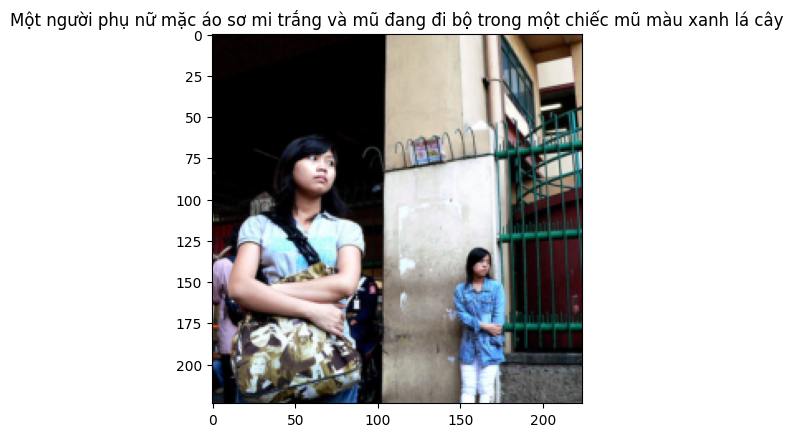

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_14.pth
Epoch: 15 loss: 2.63042


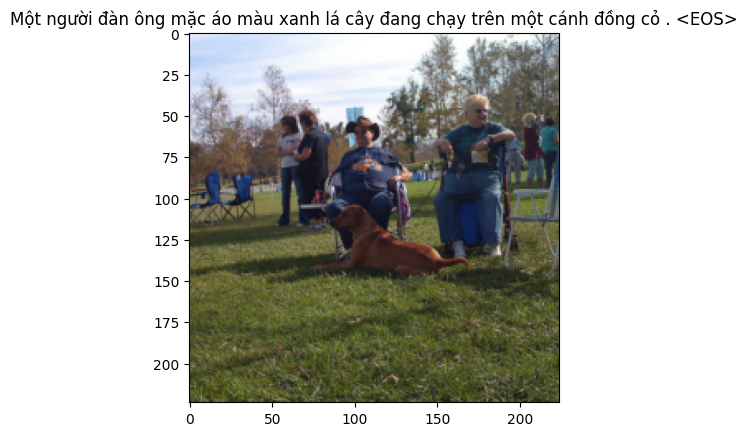

Epoch: 15 loss: 2.61184


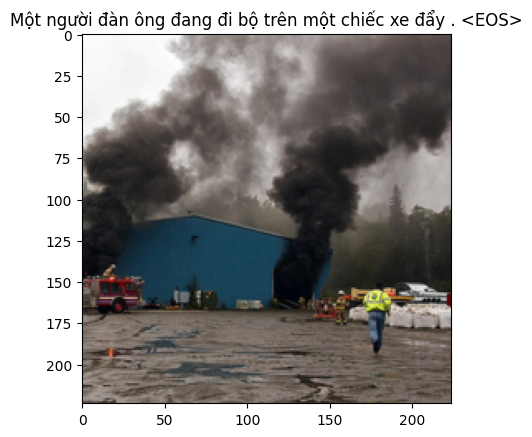

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_15.pth
Epoch: 16 loss: 2.52189


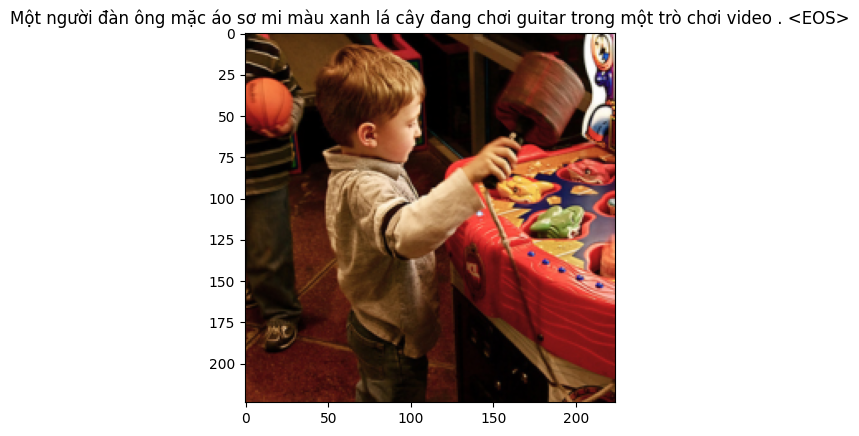

Epoch: 16 loss: 2.53603


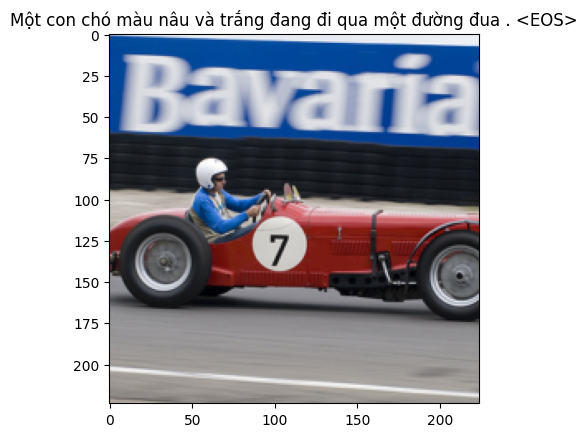

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_16.pth
Epoch: 17 loss: 2.49992


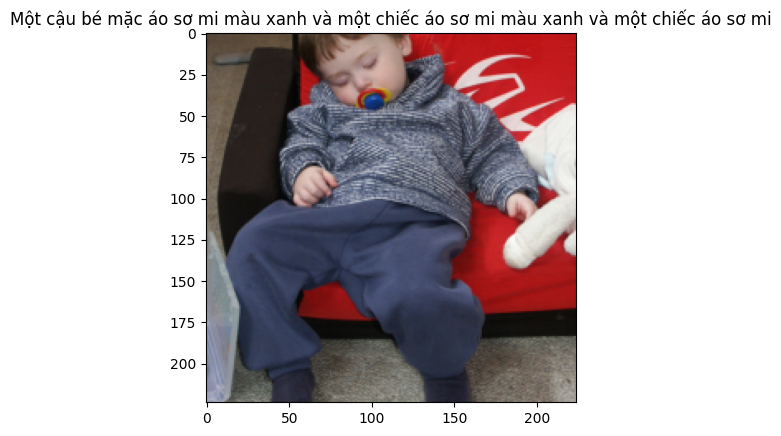

Epoch: 17 loss: 2.60873


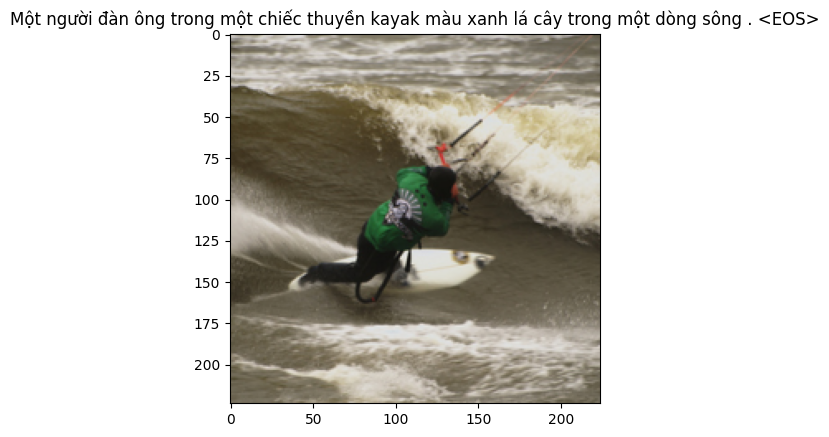

Model saved to: /content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_17.pth


In [ ]:
# num_epochs = 20
# print_every = 100

# for epoch in range(1,num_epochs+1):
#     for idx, (image, captions) in enumerate(iter(data_loader)):
#         image,captions = image.to(device),captions.to(device)

#         # Zero the gradients.
#         optimizer.zero_grad()

#         # Feed forward
#         outputs,attentions = model(image, captions)

#         # Calculate the batch loss.
#         targets = captions[:,1:]
#         loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

#         # Backward pass.
#         loss.backward()

#         # Update the parameters in the optimizer.
#         optimizer.step()

#         if (idx+1)%print_every == 0:
#             print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))


#             #generate the caption
#             model.eval()
#             with torch.no_grad():
#                 dataiter = iter(data_loader)
#                 img,_ = next(dataiter)
#                 features = model.encoder(img[0:1].to(device))
#                 caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
#                 caption = ' '.join(caps)
#                 show_image(img[0],title=caption)

#             model.train()

#     #save the latest model
#     # save_model(model,epoch)
#     save_model(model, epoch, folder_path="/content/drive/MyDrive/DeepLearning/Model")

In [ ]:
#generate caption
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        print(caps)
        show_image(features_tensors[0],title="")

    return caps,alphas

#Show attention
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)

        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())


    plt.tight_layout()
    plt.show()

In [ ]:
#Load
model = EncoderDecoder(embed_size, vocab_size, attention_dim, encoder_dim, decoder_dim)
model_state_dict = torch.load('/content/drive/MyDrive/DeepLearning/Model/vnattention_model_state_17.pth',map_location=torch.device('cpu'))['state_dict']
model.load_state_dict(model_state_dict,strict=False)

<All keys matched successfully>

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


['Một', 'con', 'chó', 'đen', 'và', 'trắng', 'chạy', 'qua', 'một', 'cánh', 'đồng cỏ', '.', '<EOS>']


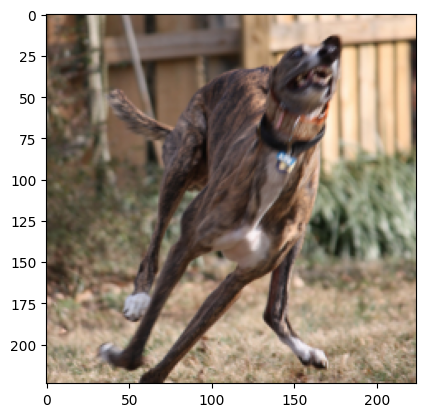

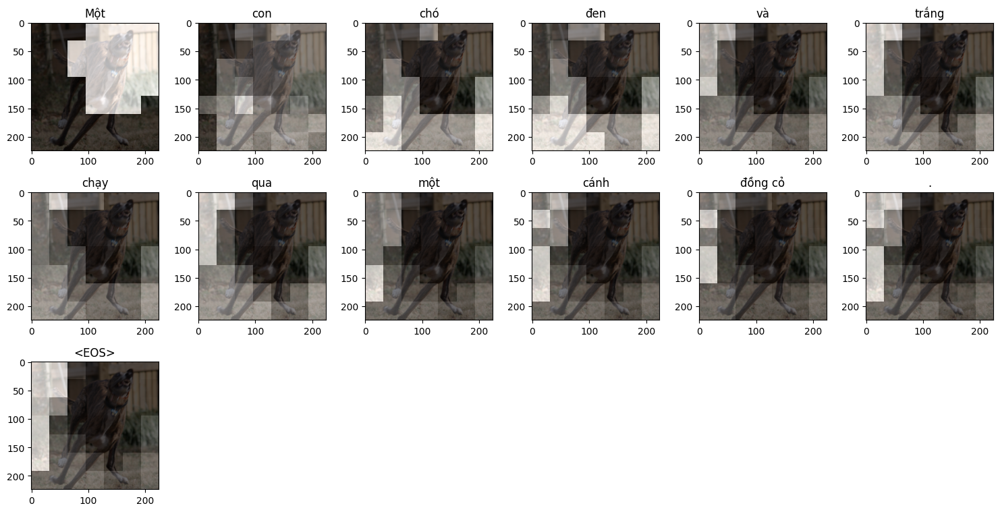

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

['Một', 'người', 'đàn ông', 'mặc', 'đồ', 'đen', 'đang', 'lướt', 'trên', 'một', 'làn sóng', '.', '<EOS>']


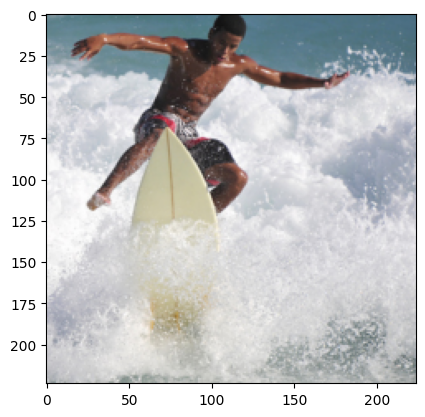

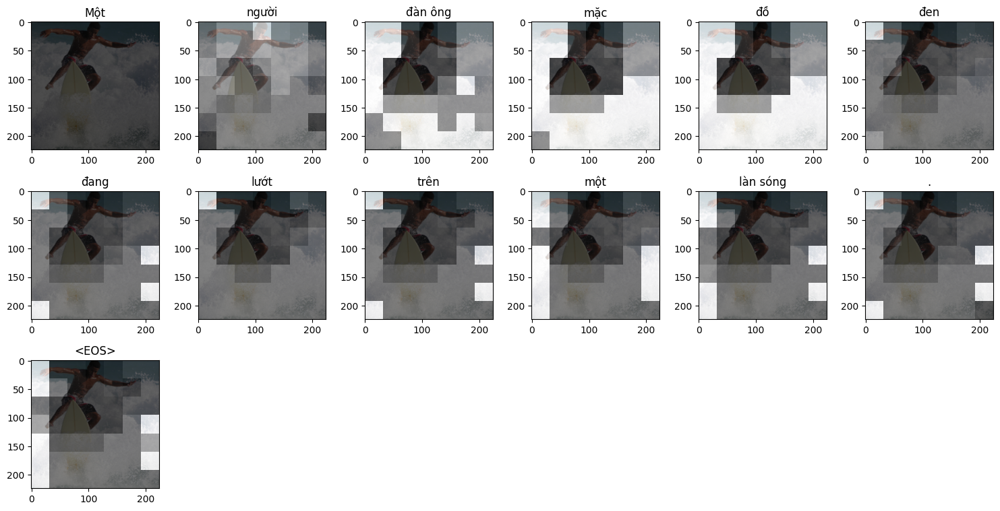

In [ ]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)